## Libraries

In [1]:
import mediapipe
import matplotlib
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import animation, rc
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd

import plotly.offline as py
import plotly.graph_objects as go
py.init_notebook_mode(connected=True)

In [2]:
from utils.data import Data
from utils.hardware import Hardware
from utils.model_utils import ModelUtils

In [3]:
base_dir: str = os.path.join(os.getcwd(), 'simulated_data')

tuple_data: tuple[list[pd.DataFrame], np.ndarray, np.ndarray] = Data.load_data(base_dir)

# Unpack data
pd_data: list[pd.DataFrame] = tuple_data[0]
labels: np.ndarray = tuple_data[1]
classes: np.ndarray = tuple_data[2]

0 VRAI HORIZONTAL
1 FAUX HORIZONTAL
2 FAUX VERTICAL
3 VRAI VERTICAL
4 NON VERTICAL
5 NON HORIZONTAL
6 OUI VERTICAL
7 OUI HORIZONTAL


In [4]:
data: np.ndarray = Data.convert_to_numpy(pd_data)

## Data Vizualisation

### 3D - Animated Plot

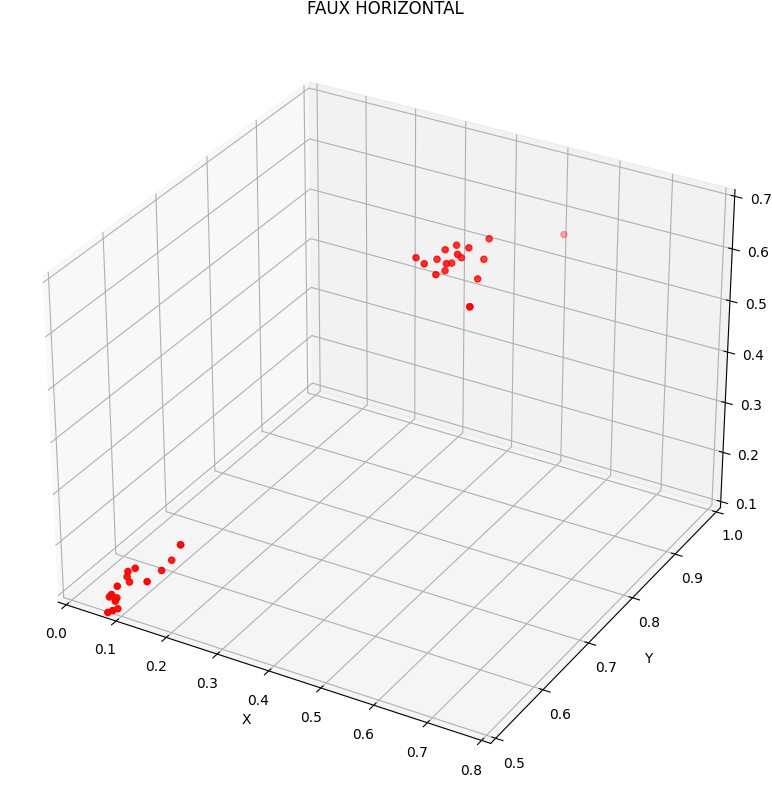

In [52]:
matplotlib.rcParams['animation.embed_limit'] = 2**128
matplotlib.rcParams['savefig.pad_inches'] = 0
rc('animation', html='jshtml')

def static_plot(landmarks: pd.DataFrame, label: str):
    # 3D plot
    x = landmarks.filter(regex='.*pos_x.*').to_numpy()
    y = landmarks.filter(regex='.*pos_y.*').to_numpy()
    z = landmarks.filter(regex='.*pos_z.*').to_numpy()
    
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title(label)

    ax.set_xlim(0, 0.8)
    ax.set_ylim(0.5, 1)
    ax.set_zlim(0.1, 0.7)
    scat = ax.scatter3D(x[0], y[0], z[0], c='r', marker='o')

    def animate(j):
        if j < landmarks.shape[0]:
            scat._offsets3d = (x[j], y[j], z[j])
        return scat

    return animation.FuncAnimation(fig, animate, frames=landmarks.shape[0], interval=30, blit=False)

i = 15
static_plot(pd_data[i], classes[labels[i]])